 # Рынок заведений общественного питания Москвы

## Цель исследования:
* провести исследование рынка общественного питания, чтобы найти подходящее место для открытия заведения.
* проанализировать данные о кофейнях Москвы, чтобы выяснить, возможно ли открыть кофейню наподобие  «Central Perk»

## План исследования:
* Загрузить данные и изучить общую информацию
* Выполнить предобработку данных 
* Провести анализ данных 
* Провести детальное исследование открытия кофейни
* Оформление презентации 

### Загрузка данных и изучение общей информации

Импортируем необходимые библиотеки

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 
from folium import Marker, Map
from folium.plugins import MarkerCluster
from numpy import median
from folium import Map, Choropleth
from folium.features import CustomIcon

Откроем датасет и посмотрим общую информацию 

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.head(15)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


* Рассмотрим детально, какие значения в датасете пропущены

In [5]:
data.isnull().sum().sort_values()

name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
hours                 536
seats                3611
avg_bill             4590
price                5091
middle_avg_bill      5257
middle_coffee_cup    7871
dtype: int64

* Оценим наличие явных дубликатов в датасете 

In [6]:
data.duplicated().sum()

0

* Оценим наличие неявных дубликатов в датасете

In [7]:
duplicate_rows = data[data.duplicated(['name', 'lat','lng'])]
duplicate_rows.count()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

In [8]:
duplicate_rows = data[data.duplicated(['name', 'address'])]
duplicate_rows.count()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

In [9]:
data['name'] = data['name'].str.lower()
data['address']=data['address'].str.lower()
duplicate_data_rows = data[data.duplicated(['name', 'address'])]
duplicate_data_rows.count()

name                 4
category             4
address              4
district             4
hours                3
lat                  4
lng                  4
rating               4
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                4
seats                3
dtype: int64

In [10]:
data = data.drop_duplicates(subset=['name', 'address'])

In [11]:
duplicate_data_rows = data[data.duplicated(['name', 'address'])]
duplicate_data_rows.count()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

<div class="alert alert-success">
Вывод
    
 * Датасет содержит 8406 строк, 14 столбцов
 * Обнаружены дубликаты в столбцах 'name', 'address', дубликаты удалены

Обнаруживаются следующие ошибки:
* Пропущены данные в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats
</div>

### Предобработка данных

* Посмотрим детально столбец avg_bill

In [12]:
def show_unique(column):
    return data[column].unique()

In [13]:
show_unique('avg_bill')

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

* Посмотрим детально столбец price

In [14]:
show_unique('price')

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

* В столбцах avg_bill и price аномальных значений не выявлено.
* Оставим пропущенные значения как есть 


* Посмотрим детально столбец price

Создадим столбец street с названиями улиц из столбца с адресом.

In [15]:
street_types = ['улица', 'бульвар', 'проспект', 'переулок', 'шоссе', 
'проезд', 'набережная', 'площадь', 'аллея', 'линия', 'квартал', 'мост', 'тупик', 'просек', 'мкад', 'парк', 'ландшафтный', 'сквер', 'округ','ул', 'пр-т','сад','бор','музей-заповедник','тоннель','кольцо', '2/12','№']
def street_finder(address):
    for address_part in address.split(', '):
        for street_type in street_types:
            if address_part.lower().find(street_type)!= -1:
                return address_part
data['street'] = data['address'].apply(street_finder)

In [16]:
data.head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,ижорская улица
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,клязьминская улица
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,ангарская улица


* Создалим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
 * логическое значение True — если заведение работает ежедневно и круглосуточно;
 * логическое значение False — в противоположном случае.

In [17]:
def create_column(column):
    try:
        new_column  = column.split(' ')[0:]
        if 'круглосуточно' in new_column:
            return True
        else:
            return False
    except AttributeError:
        return False
data['is_24_7'] = data['hours'].apply(create_column)

In [18]:
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,ижорская улица,False
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица,False
7,mr. уголёк,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,клязьминская улица,False
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,ангарская улица,False


In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24_7            8402 non-null   bool   
dtypes: bool(1), float64(6), 

Столбцы street и is_24_7 созданы правильно и без пропусков

* Посмотрим распределение в количественных данных столбцов middle_avg_bill, middle_coffee_cup

In [20]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

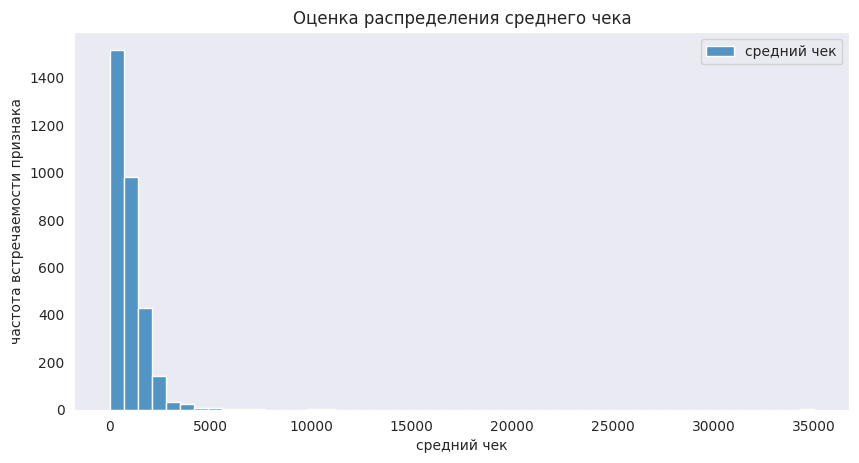

In [21]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.set_style('dark') 
sns.histplot(data['middle_avg_bill'], bins=50) 
plt.title('Оценка распределения среднего чека')
plt.xlabel('средний чек')
plt.ylabel('частота встречаемости признака')
plt.legend(['средний чек'])
plt.show()

В столобце middle_avg_bill наблюдаем распределение Пуассона, среднее значение среднего чека 958, наблюдаем большое стандартное отклонение, наблюдаемое за счет выбросов (максимальное значение 35000), а так же большого количества пропущенных значений. Медианное  значение 750. 

In [22]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

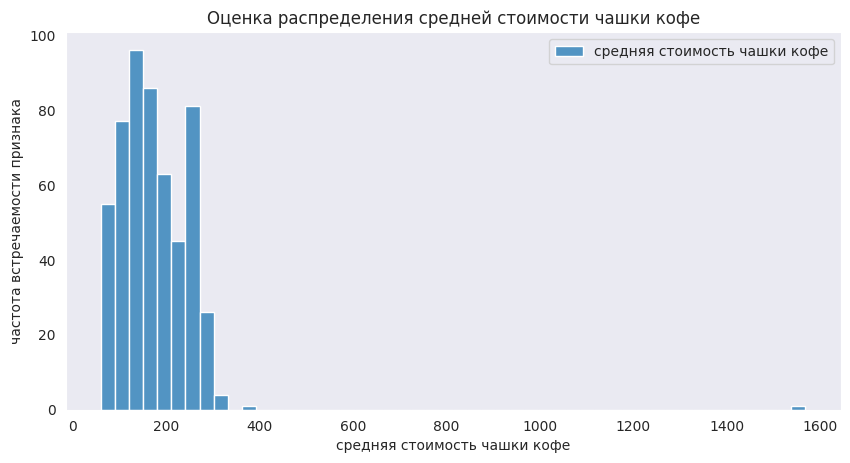

In [23]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.set_style('dark') 
sns.histplot(data['middle_coffee_cup'], bins=50) 
plt.title('Оценка распределения средней стоимости чашки кофе')
plt.xlabel('средняя стоимость чашки кофе')
plt.ylabel('частота встречаемости признака')
plt.legend(['средняя стоимость чашки кофе'])
plt.show()

В столбце middle_coffee_cup наблюдается большое количество значений в районе 300, а так же в районе медианы 169. Так же видим очень большой выброс в районе 1600. 

<div class="alert alert-success">
ВЫВОД
    
* В столбцах avg_bill и price аномальных значений не выявлено

* Пропущенные значения оставили без изменений

* Создали столбцы street и  is_24_7
* В столбце middle_avg_bil наблюдаем распределение Пуассона. Среднее значение среднего чека 958, наблюдаем большое стандартное отклонение, наблюдаемое за счет выбросов (максимальное значение 35000), а так же большого количества пропущенных значений. Медианное  значение 750. 
* В столбце middle_coffee_cup наблюдается большое количество значений в районе 300, а так же в районе медианы 169. Так же видим очень большой выброс в районе 1600.
</div>

### Анализ данных

#### Исследование количество объектов общественного питания по категориям.

In [24]:
grouped_category=data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()

In [25]:
grouped_category

,category,name
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


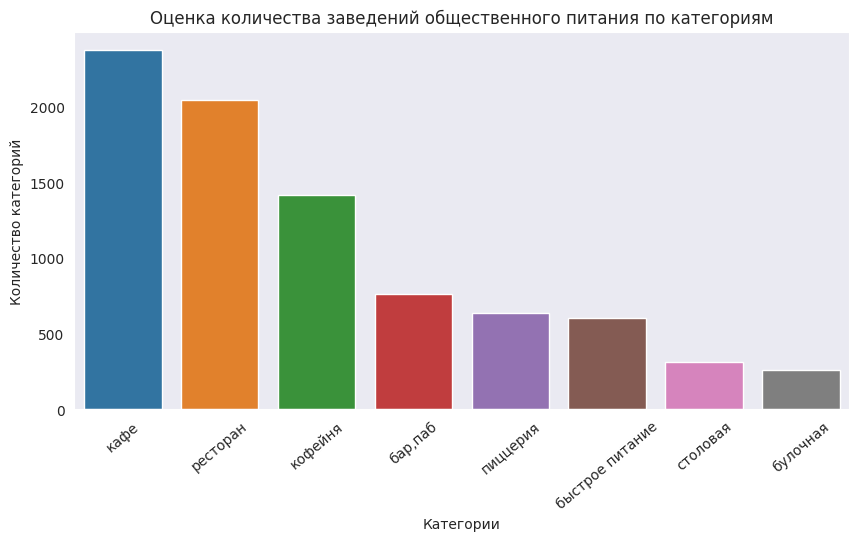

In [26]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.barplot(x='category', y='name', data=grouped_category)
plt.xticks(rotation=40)
plt.title('Оценка количества заведений общественного питания по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество категорий')
plt.show()


<div class="alert alert-success">
Вывод
    
По графику видим, что превалирующей категорией в Москве являются кафе, на втором месте рестораны и кофейни. Наименее распространены столовые и булочные. 

</div>

#### Исследование количества посадочных мест в местах по категориям.

In [27]:
grouped_category_seats=data.pivot_table(index='category', values='seats', aggfunc='median').sort_values(by='seats',ascending=False).reset_index()

In [28]:
grouped_category_seats

,category,seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


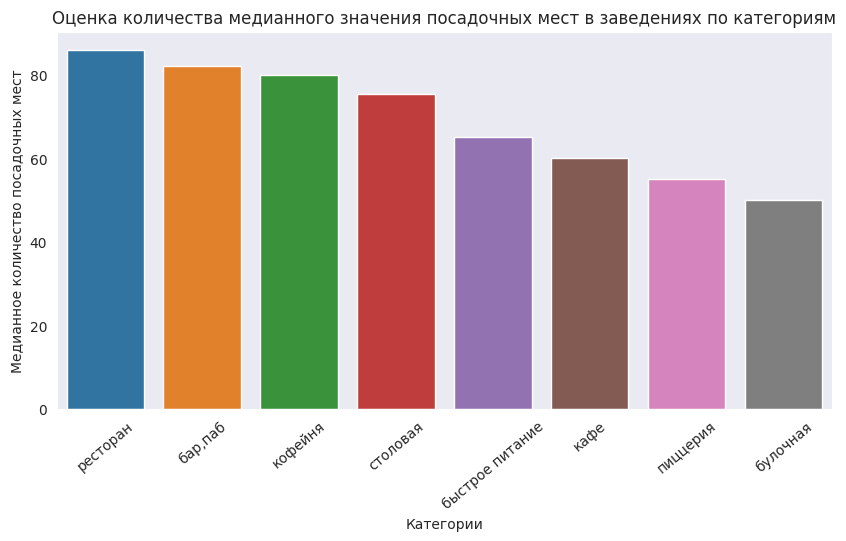

In [29]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.barplot(x='category', y='seats', data=grouped_category_seats)
plt.xticks(rotation=40)
plt.title('Оценка количества медианного значения посадочных мест в заведениях по категориям')
plt.xlabel('Категории')
plt.ylabel('Медианное количество посадочных мест')
plt.show()


<div class="alert alert-success">
Вывод
    
Наибольшее количество посадочных мест наблюдается в ресторанах, барах, пабах и кофейнях. В целом медианные значения не сильно различаются: медианное количество посадочных мест во всех категориях варьирует от 50 до 86. Наименьшее количество посадочных мест наблюдается в булочных. Все логично и не противоречит здравому смыслу. 

</div>



#### Соотношение сетевых и несетевых заведений в датасете. 

In [30]:
grouped_chain=data.groupby('chain')['name'].count().reset_index()

In [31]:
grouped_chain

,chain,name
0,0,5199
1,1,3203


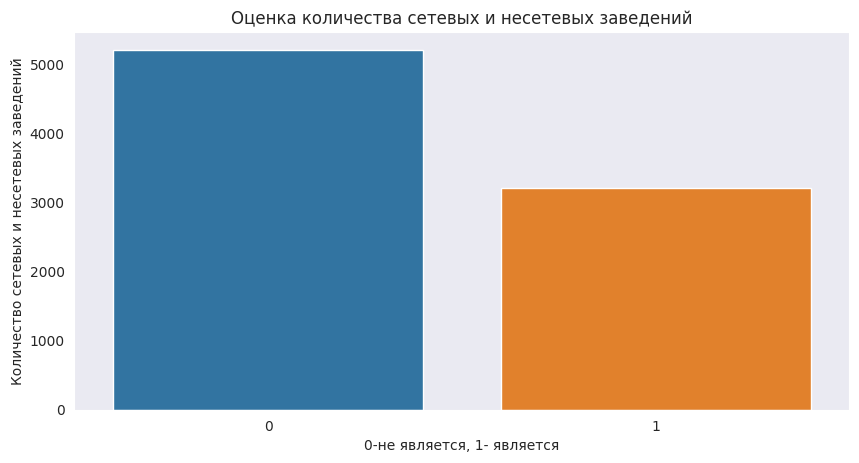

In [32]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.barplot(x='chain', y='name', data=grouped_chain)
plt.title('Оценка количества сетевых и несетевых заведений')
plt.ylabel('Количество сетевых и несетевых заведений')
plt.xlabel('0-не является, 1- является')
plt.show()

In [33]:
grouped_chain['percents'] = (grouped_chain['name'] / grouped_chain['name'].sum() * 100).round().astype('int')

In [34]:
grouped_chain

,chain,name,percents
0,0,5199,62
1,1,3203,38


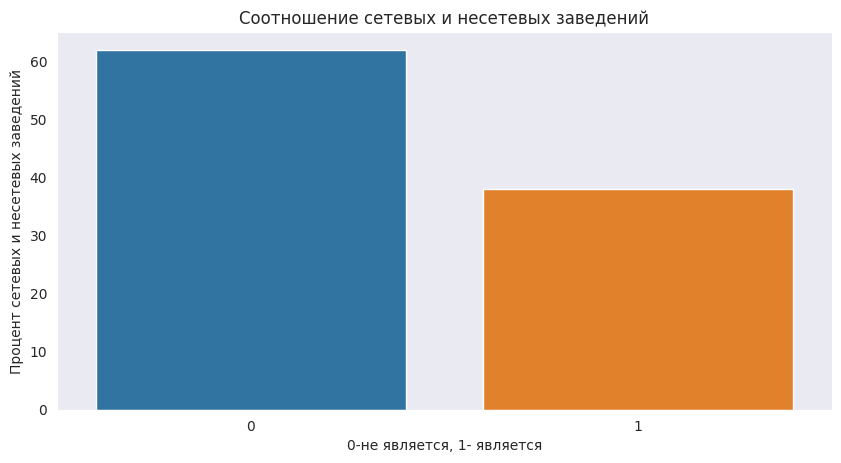

In [35]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.barplot(x='chain', y='percents', data=grouped_chain)
plt.title('Соотношение сетевых и несетевых заведений')
plt.ylabel('Процент сетевых и несетевых заведений')
plt.xlabel('0-не является, 1- является')
plt.show()


<div class="alert alert-success">
Вывод
    
* По данным графика видно, что в Москве превалируют несетевые заведения. 
* Только 38% заведений имеют сетевую организацию

</div>



#### Определение категории заведений по сетевой организации

In [36]:
grouped_category_chain=data.pivot_table(index='category', columns='chain', values='name', aggfunc='count').reset_index()

In [37]:
grouped_category_chain

chain,category,0,1
0,"бар,паб",596,168
1,булочная,99,157
2,быстрое питание,371,232
3,кафе,1597,779
4,кофейня,693,720
5,пиццерия,303,330
6,ресторан,1313,729
7,столовая,227,88


In [38]:
merge_category = grouped_category.merge(grouped_category_chain, on='category')

In [39]:
merge_category

,category,name,0,1
0,кафе,2376,1597,779
1,ресторан,2042,1313,729
2,кофейня,1413,693,720
3,"бар,паб",764,596,168
4,пиццерия,633,303,330
5,быстрое питание,603,371,232
6,столовая,315,227,88
7,булочная,256,99,157


In [40]:
percent_category_chain = merge_category[1]/merge_category['name']
percent_category_chain = (percent_category_chain * 100).round().astype('int')
merge_category['percent'] = percent_category_chain
merge_category= merge_category.sort_values(by='percent', ascending=False) 
merge_category

,category,name,0,1,percent
7,булочная,256,99,157,61
4,пиццерия,633,303,330,52
2,кофейня,1413,693,720,51
5,быстрое питание,603,371,232,38
1,ресторан,2042,1313,729,36
0,кафе,2376,1597,779,33
6,столовая,315,227,88,28
3,"бар,паб",764,596,168,22


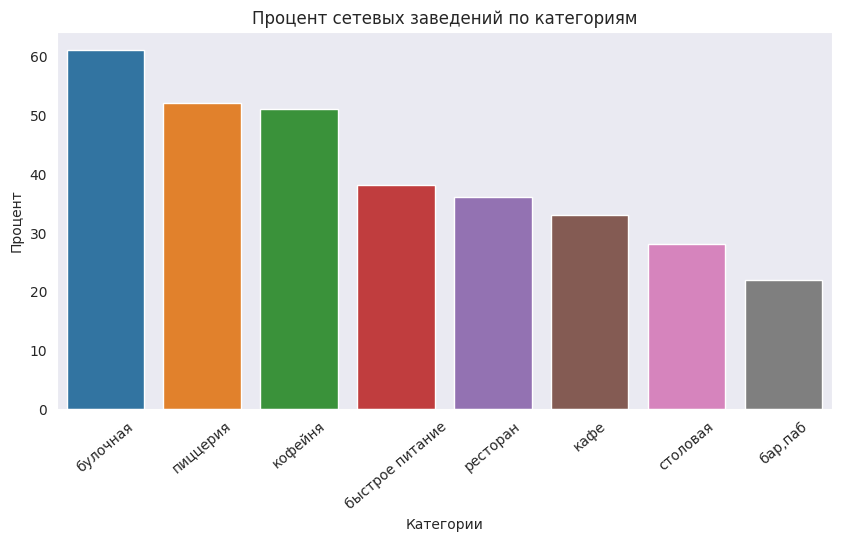

In [41]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.barplot(x='category', y='percent', data=merge_category )
plt.xticks(rotation=40)
plt.title('Процент сетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Процент')
plt.show()


<div class="alert alert-success">
Вывод

Среди всех категорий наиболее часто сетевой подход встречается у булочных, пиццерий и кофеен. Менее всего склонны к организаций сетевых заведенеий столовые, бары и пабы.

</div>

 

#### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. 

In [42]:
grouped_name = data.pivot_table(index=['name','category'], values='address', aggfunc='count').sort_values(by='address',ascending=False).reset_index()

In [43]:
grouped_name = grouped_name.loc[0:15]

In [44]:
grouped_name

,name,category,address
0,кафе,кафе,158
1,шоколадница,кофейня,119
2,домино'с пицца,пиццерия,77
3,додо пицца,пиццерия,74
4,one price coffee,кофейня,72
5,яндекс лавка,ресторан,69
6,cofix,кофейня,65
7,prime,ресторан,49
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


"Кафе" - кафе и "Ресторан" - ресторан вызывает сомнения,выберем значения из базы и посмотрим что это за места 

In [45]:
data.loc[data['name']=='Кафе']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


In [46]:
data.loc[data['name']=='Ресторан']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


Выборочно проверив адреса на карте, обнаружилось, что это мелкие точки общепита на заправках или при магазинах, не являющихся одним сетевым заведением. При проверке адресов ресторанов, оказалось, что это так же не сетевые заведения а локальные мелкие рестораны с низким рейтингом. 
Придется исключить эти данные из grouped_name. 

In [47]:
grouped_name = grouped_name.query('name != "Кафе" and name != "Ресторан"')

In [48]:
grouped_name

,name,category,address
0,кафе,кафе,158
1,шоколадница,кофейня,119
2,домино'с пицца,пиццерия,77
3,додо пицца,пиццерия,74
4,one price coffee,кофейня,72
5,яндекс лавка,ресторан,69
6,cofix,кофейня,65
7,prime,ресторан,49
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


In [49]:
fig = px.bar(grouped_name, x='name', y='address', color='category', title='Топ-15 сетей общественного питания в Москве', labels={"name": "Заведения", "address": "Количество заведений", 'category':'Категории заведений'})
fig.update_xaxes(tickangle=45)
fig.show() 

<div class="alert alert-success">
ВЫВОД

*  В этом разделе мы обнаружили ошибки в датафрейме, кафе под названием "Кафе" и ресторанов "Ресторан" не существует в Москве. При выборочной проверке адресов оказалось, что это мелкие заведения при заправках, трассах или малобюджетные рестораны, не являющихся сетевыми заведениями. 

*  Строго говоря, "Яндекс Лавку" не стоит считать полноценным завдением, это пункты выдачи/складов заказов. Но я не стала исключать из списка, так как нас интересуют все виды общепита.
    
*  Больше всего точек в Москве у "Шоколадницы" и "Домино'с пиццы", Вторые места разделяют 'One Price Coffee','Яндекс Лавка', 'Coffix','Додо Пицца'
    
* Все эти заведения объединяет,по-моему мнению, некоторый формат "бистро", где заказы отдаются достаточно быстро.

* Отмечу, что в датафрейме нет ресторанов быстрого питания: 'Вкусно и точка', 'Бургеркинг' и тд, потому что по запросу в яндекс картах однх только заведений 'Вкусно и точка' в Москве 198 организаций!

</div>


#### Обзор административных районов Москвы в датасете

In [50]:
data.groupby('district')['name'].count()

district
Восточный административный округ            798
Западный административный округ             850
Северный административный округ             898
Северо-Восточный административный округ     890
Северо-Западный административный округ      409
Центральный административный округ         2242
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Южный административный округ                892
Name: name, dtype: int64

<div class="alert alert-success">
ВЫВОД

* В датасете представленны все административные районы Москвы
</div>

#### Рейтинг по категориям заведений.

In [51]:
grouped_category_rating = data.pivot_table(index='category', values='rating', aggfunc='median').sort_values(by='rating',ascending=False).reset_index()

In [52]:
grouped_category_rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
2,кофейня,4.3
3,пиццерия,4.3
4,ресторан,4.3
5,столовая,4.3
6,быстрое питание,4.2
7,кафе,4.2


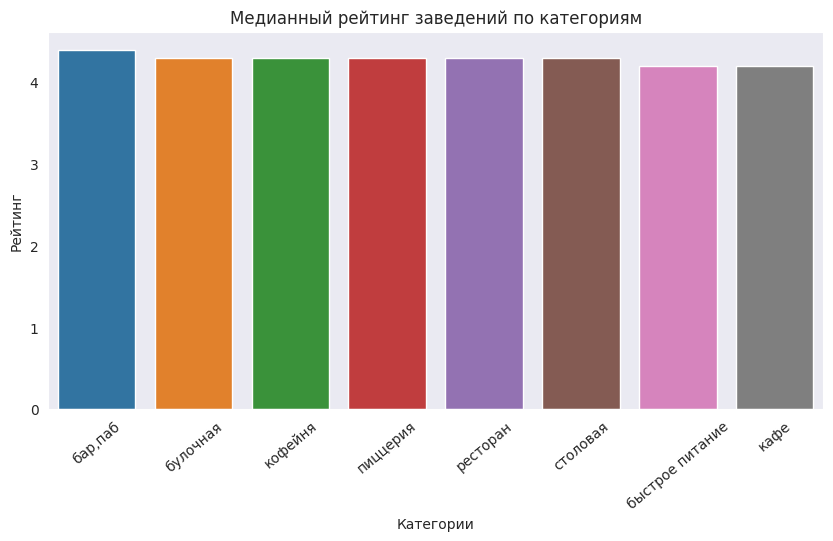

In [53]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.barplot(x='category', y='rating', data=grouped_category_rating)
plt.xticks(rotation=40)
plt.title('Медианный рейтинг заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Рейтинг')
plt.show()

<div class="alert alert-success">
ВЫВОД

* Из графика наблюдаем, что медианный рейтинг заведений практически одинаковый и колеблется  в диапазоне от 4.2 до 4.4
</div>

#### Средний рейтинг заведений по административным районам

In [54]:
grouped_district_rating = data.pivot_table(index='district', values='rating', aggfunc='median').sort_values(by='rating',ascending=False).reset_index()

In [55]:
grouped_district_rating

,district,rating
0,Центральный административный округ,4.4
1,Восточный административный округ,4.3
2,Западный административный округ,4.3
3,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Юго-Западный административный округ,4.3
6,Южный административный округ,4.3
7,Северо-Восточный административный округ,4.2
8,Юго-Восточный административный округ,4.2


In [56]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo ,
    data=grouped_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Рейтинг заведений',
).add_to(m)

m

<div class="alert alert-success">
ВЫВОД

* В графике наблюдаем, что медианный рейтинг заведений по всем районам кардинально не отличается, но в Центральном районе рейтинг ожидаемо заведений несколько выше, чем во всех остальных. 
</div>

####  Все заведения датасета на карте. 

In [57]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/dusk/64/food.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)
data.apply(create_clusters, axis=1)
m



#### Топ 15-улиц по количеству заведений

In [58]:
grouped_street = data.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name', ascending=False).reset_index()

In [59]:
grouped_street = grouped_street[:15]

In [60]:
grouped_street

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


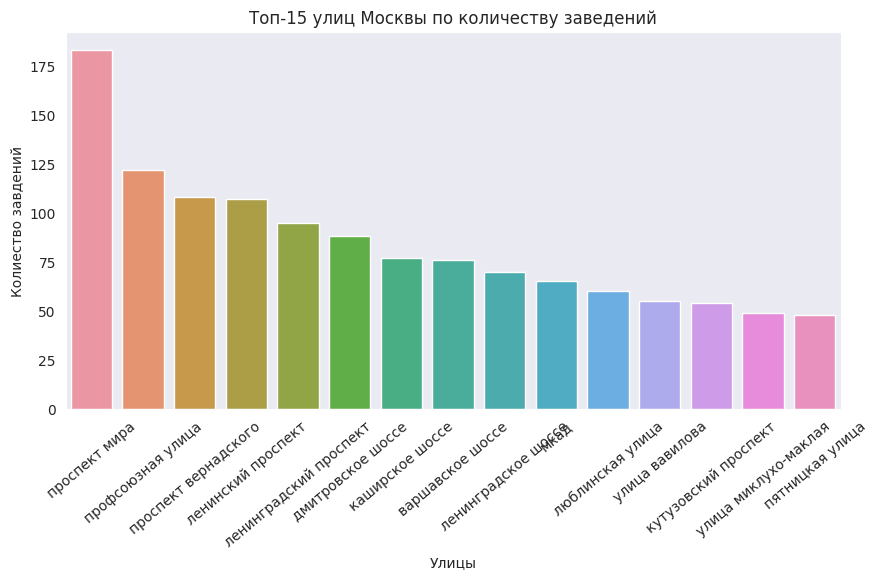

In [61]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
sns.barplot(x='street', y='name', data=grouped_street)
plt.xticks(rotation=40)
plt.title('Топ-15 улиц Москвы по количеству заведений')
plt.xlabel('Улицы')
plt.ylabel('Колиество завдений')
plt.show()

<div class="alert alert-success">
ВЫВОД

* Из графика наблюдаем, что больше всего заведений находится на проспекте Мира, более 175 ед. 
</div>

#### Улицы, на которых находится только один объект общепита.

Отсортируем датафрейм по названиям улиц. 

In [62]:
sorted_street = data.pivot_table(index=['street'], values='category', aggfunc='count').sort_values(by='street').reset_index()
sorted_street = sorted_street.query('category == 1')
sorted_street = sorted_street.merge(data, on='street', how='inner')
sorted_street = sorted_street[['street', 'name', 'category_y', 'lat','lng', 'rating']]

In [63]:
sorted_street

,street,name,category_y,lat,lng,rating
0,1-й автозаводский проезд,чайхана азия,кафе,55.704847,37.657065,4.2
1,1-й балтийский переулок,хуан хэ,ресторан,55.810418,37.518824,4.4
2,1-й варшавский проезд,колизей,кафе,55.648674,37.627979,4.0
3,1-й вешняковский проезд,deli by shell,кафе,55.723152,37.794014,3.4
4,1-й голутвинский переулок,shelby,"бар,паб",55.739600,37.613494,4.1
...,...,...,...,...,...,...
455,электрический переулок,галерея вкуса,столовая,55.771942,37.575779,4.3
456,юго-западный административный округ,семь хлебов,кафе,55.677944,37.575202,4.9
457,якиманский переулок,drink eat travel,кафе,55.733299,37.610099,4.7
458,яковоапостольский переулок,кофепровод,кофейня,55.758703,37.654258,4.4


In [64]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/dusk/64/food.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category_y']}",
        icon=icon,
    ).add_to(marker_cluster)
sorted_street.apply(create_clusters, axis=1)
m

In [65]:
sorted_street_rating = sorted_street.pivot_table(index='category_y', values='rating', aggfunc='median').sort_values(by='rating', ascending=False).reset_index()


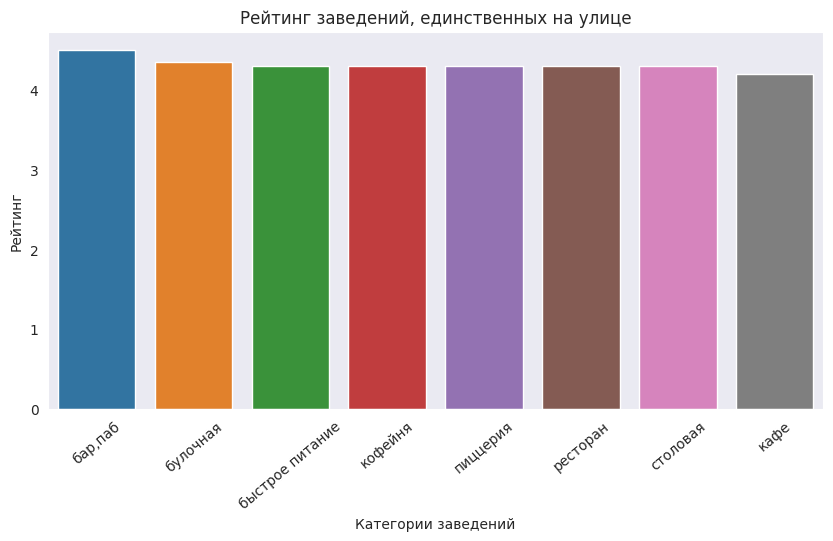

In [66]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
ax = sns.barplot(x='category_y', y='rating', data=sorted_street_rating) 
plt.xticks(rotation=40)
plt.title('Рейтинг заведений, единственных на улице')
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг')
plt.show()

<div class="alert alert-success">
ВЫВОД

* Отсортировали датасет и оставили только те улицы, на которых находится только 1 завдение. 
* Обнаруживается большое количество "проездов", "переулков", соединяющие крупные улицы, а так же небольшие улицы.
* У всех этих заведений медианный рейтинг от 4 до 4,5.

</div>

#### Анализ цены в центральном административном округе и других. 

Сгруппируем данные и найдем медианные значения middle_avg_bil для каждого района. 

In [67]:
grouped_district_avg_bill = data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').sort_values(by='middle_avg_bill').reset_index()

In [68]:
grouped_district_avg_bill

,district,middle_avg_bill
0,Юго-Восточный административный округ,450.0
1,Северо-Восточный административный округ,500.0
2,Южный административный округ,500.0
3,Восточный административный округ,575.0
4,Юго-Западный административный округ,600.0
5,Северный административный округ,650.0
6,Северо-Западный административный округ,700.0
7,Западный административный округ,1000.0
8,Центральный административный округ,1000.0


In [69]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=grouped_district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

m

<div class="alert alert-success">
ВЫВОД

*  Ожидаемо, что средний чек в центральном и западном районах Москвы самый выскокий - 1000р, На втором месте Северо-западный, Северный и Юго-завапдный, средний чек - 600-700 р. Третье место разделяют остальные районы, средний чек - 450-575р. 

*  По графику наблюдаем, что не прослеживается четкой зависимости между удаленностью от центра и ценообразованием. Отдленные от центра участки западного района Москвы имеют тот же средний чек, что и центральный, а близлежащие районы наоборот имеют небольшой средний чек.


</div>




### Открытие кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

Посчитаем количество кофеен в датасете

In [70]:
data.loc[data['category']=='кофейня']['name'].count()


1413

In [71]:
data_cafe = data.loc[data['category']=='кофейня']

In [72]:
data_cafe

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,новохохловская улица,False


In [73]:
grouped_district_cafe = data_cafe.pivot_table(index='district', values='name', aggfunc='count').sort_values(by='name').reset_index()

In [74]:
grouped_district_cafe

,district,name
0,Северо-Западный административный округ,62
1,Юго-Восточный административный округ,89
2,Юго-Западный административный округ,96
3,Восточный административный округ,105
4,Южный административный округ,131
5,Западный административный округ,150
6,Северо-Восточный административный округ,159
7,Северный административный округ,193
8,Центральный административный округ,428


In [75]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo,
    data=grouped_district_cafe,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Распрпеделение кофеен по районам',
).add_to(m)

m

<div class="alert alert-success">
ВЫВОД

*  Общее колиество кофеен в датасете - 1413

* По графику наблюдаем наибольшее количество кофеен в центральном районе, на втором месте Западный административный округ, Северо-Восточный административный округ, Северный административный округ. Меньше всего кофеен в Северо-Западном,  Юго-Восточном, Юго-Западном, Восточном.

</div>


#### Есть ли круглосуточные кофейни?

In [76]:
grouped_cafe_time = data_cafe.loc[data['is_24_7']==True]

In [77]:
grouped_cafe_time

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,дмитровское шоссе,True
971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,ярославское шоссе,True
1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,ярославское шоссе,True
1214,wild bean cafe,кофейня,"москва, мкад, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,мкад,True
1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица народного ополчения,True
1468,кофе хауз,кофейня,"москва, ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,1,NaN,ленинградский проспект,True
1790,кофемания,кофейня,"москва, ленинградский проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,1,15.0,ленинградский проспект,True
1825,you&coffee,кофейня,"москва, улица золоторожский вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,1,NaN,улица золоторожский вал,True
1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,1,140.0,лесная улица,True
2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,1,230.0,долгоруковская улица,True


In [78]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/external-flaticons-lineal-color-flat-icons/64/external-cofee-morning-flaticons-lineal-color-flat-icons.png'
    icon = icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}",
        icon=icon,
    ).add_to(marker_cluster)
grouped_cafe_time.apply(create_clusters, axis=1)
m



<div class="alert alert-success">
ВЫВОД

* Круглосуточные кофейни существуют, расположены преимущественно в центральном районе. В остальных районах лишь единичные кофейни работают круглосуточно.

</div>


#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [79]:
grouped_cafe_rating = data_cafe.pivot_table(index='district', values='rating', aggfunc='median').sort_values(by='rating').reset_index()

In [80]:
grouped_cafe_rating

,district,rating
0,Западный административный округ,4.2
1,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [81]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo ,
    data=grouped_cafe_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Распределение рейтинга кофеен по районам',
).add_to(m)

m

<div class="alert alert-success">
ВЫВОД

* По графику видим, что медианный рейтинг кофеен во всех районах практически одинаковый, колеблется в диапазоне от 4.2 до 4.3

</div>


#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Предположим, что стоимость средней чашки капучино будет зависеть от расположения кофейни.
Сгруппируем данные и построим хороплет.

In [82]:
grouped_cafe_middle = data_cafe.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').sort_values(by='middle_coffee_cup').reset_index()

In [83]:
grouped_cafe_middle

,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Юго-Восточный административный округ,147.5
2,Южный административный округ,150.0
3,Северный административный округ,159.0
4,Северо-Восточный административный округ,162.5
5,Северо-Западный административный округ,165.0
6,Западный административный округ,189.0
7,Центральный административный округ,190.0
8,Юго-Западный административный округ,198.0


In [84]:
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=state_geo ,
    data=grouped_cafe_middle,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Медианная цена чашки капучино',
).add_to(m)

m

<div class="alert alert-success">
ВЫВОД

* Медианная цена чашки капучно в центральном, юго-западном и западном административных округах находится в районе 200 р. Наименьшая медианная цена чашки капучино наблюдается в восточном райне, в остальных районах медианная цена 150-160 р.

</div>


#### Распределение кофеен по улицам Центрального района

Из данного датасета мы не можем определить трафик кофеен, но так как нам известно, что большая плотность кофеен наблюдается в центральном районе, и заказчики не боятся конкуренции, будем предполагать, что наибольший трафик будет в центральном районе.
Посмотрим детальнее, на каких улицах центрального района больше всего кофеен и будем ориентироваться на их опыт по трафику. 

In [85]:
grouped_street = data_cafe.loc[data_cafe['district'] == 'Центральный административный округ']

In [86]:
grouped_cafe_street = grouped_street.pivot_table(index='street', values='name', aggfunc='count').sort_values(by='name',ascending=False).reset_index()

In [87]:
grouped_cafe_street = grouped_cafe_street[0:10]

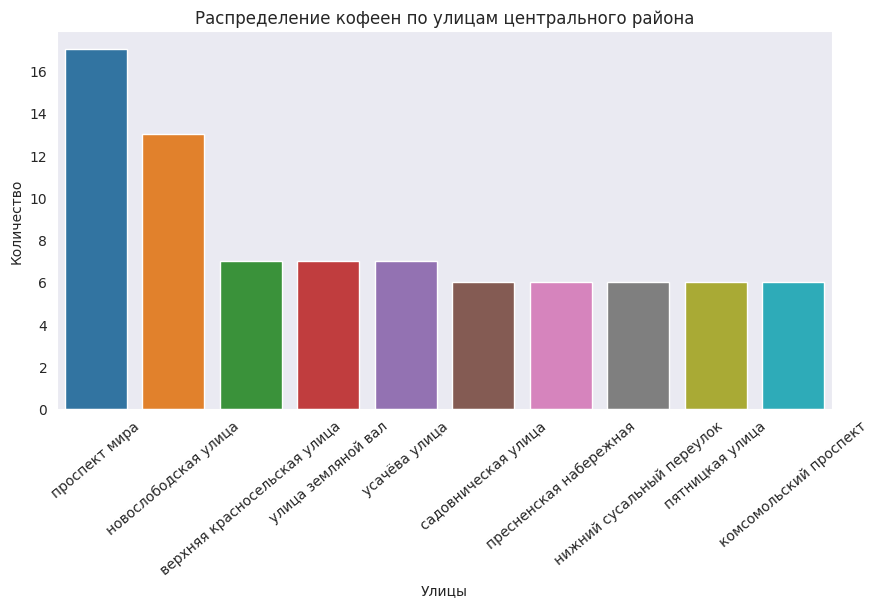

In [88]:
plt.figure(num=None, figsize=(10, 5), dpi=100)
ax = sns.barplot(x='street', y='name', data=grouped_cafe_street, estimator=median) 
plt.xticks(rotation=40)
plt.title('Распределение кофеен по улицам центрального района')
plt.xlabel('Улицы')
plt.ylabel('Количество')
plt.show()

Наибольшее количество кофеен находится на Проспекте Мира и Новослободской улице. 
Построим визуализацию и посмотрим расположение кофеен на проспекте мира.

In [89]:
grouped_street_nov_mir = data_cafe.loc[(data_cafe['street'] == 'проспект мира') | (data_cafe['street'] == 'новослободская улица')]

In [90]:
grouped_street_nov_mir

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
960,vigor maker,кофейня,"москва, проспект мира, 119, стр. 227",Северо-Восточный административный округ,"пн-пт 08:30–21:00; сб,вс 10:00–21:00",55.825921,37.636862,4.4,средние,Цена чашки капучино:200–250 ₽,NaN,225.0,0,NaN,проспект мира,False
986,mosweet,кофейня,"москва, проспект мира, 211, корп. 2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.845872,37.660937,4.4,NaN,NaN,NaN,NaN,0,273.0,проспект мира,False
1019,leocoffee,кофейня,"москва, проспект мира, 119, стр. 501",Северо-Восточный административный округ,пн-пт 08:00–22:15; сб 08:00–23:00; вс 08:00–22:00,55.836283,37.626210,4.3,средние,Цена чашки капучино:140–220 ₽,NaN,180.0,0,NaN,проспект мира,False
1057,cofix,кофейня,"москва, проспект мира, 211к2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.845950,37.661094,4.1,NaN,Цена чашки капучино:от 60 ₽,NaN,60.0,1,NaN,проспект мира,False
1101,кофе-пойнт техноград,кофейня,"москва, проспект мира, 119, стр. 63",Северо-Восточный административный округ,"пн-пт 10:00–19:00; сб,вс 11:00–20:00",55.834948,37.631908,4.2,NaN,NaN,NaN,NaN,0,NaN,проспект мира,False
1119,шоколадница,кофейня,"москва, проспект мира, 119, стр. 23",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.832547,37.618962,3.9,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,NaN,проспект мира,False
1120,cafe 55,кофейня,"москва, проспект мира, 119, стр. 55",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.835176,37.622926,4.1,NaN,NaN,NaN,NaN,0,NaN,проспект мира,False
1131,кофепорт,кофейня,"москва, проспект мира, 119, стр. 7",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.827676,37.626779,4.0,NaN,Цена чашки капучино:90–100 ₽,NaN,95.0,1,80.0,проспект мира,False
1142,cinnabon,кофейня,"москва, проспект мира, 211к2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.845581,37.661306,2.6,NaN,NaN,NaN,NaN,1,NaN,проспект мира,False
1149,coffee&croissant,кофейня,"москва, проспект мира, 119, стр. 525",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.831099,37.625172,4.1,NaN,NaN,NaN,NaN,0,NaN,проспект мира,False


In [91]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    icon_url = 'https://img.icons8.com/external-flaticons-lineal-color-flat-icons/64/external-cofee-morning-flaticons-lineal-color-flat-icons.png'
    icon = icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['middle_coffee_cup']}",
        icon=icon,
    ).add_to(marker_cluster)
grouped_street_nov_mir.apply(create_clusters, axis=1)
m

<div class="alert alert-success">
ВЫВОД

* На карте видим, что все кофейни находятся за пределами садового кольца, значит, не выгодно открывать кофейню в самом центре Москвы. 
* 10 кофеен расположены возле ВДНХ на проспекте Мира. Было бы логично открыть кофейню в этой области, если заказчик хочет полностью повторить успех Central Perk (название из сериала Friends связано с Центральным Парком)

</div>



## Заключение

<div class="alert alert-info">
ВЫВОД ПО ОБЩЕМУ АНАЛИЗУ ЗАВЕДЕНИЙ МОСКВЫ

* Превалирующей категорией в Москве являются кафе, на втором месте рестораны и кофейни. Наименее распространены столовые и булочные. 

* Наибольшее количество посадочных мест наблюдается в ресторанах, барах, пабах и кофейнях. В целом медианные значения не сильно различаются: медианное количество посадочных мест во всех категориях варьирует от 50 до 86. Наименьшее количество посадочных мест наблюдается в булочных
    
* Среди всех категорий наиболее часто сетевой подход встречается у булочных, пиццерий и кофеен. Менее всего склонны к организаций сетевых заведенеий столовые, бары и пабы.

*  В этом разделе мы обнаружили ошибки в датафрейме, кафе под названием "Кафе" и ресторанов "Ресторан" не существует в Москве. При выборочной проверке адресов оказалось, что это мелкие заведения при заправках, трассах или малобюджетные рестораны, не являющихся сетевыми заведениями.
    
*  Больше всего точек в Москве у "Шоколадницы" и "Домино'с пиццы", Вторые места разделяют 'One Price Coffee','Яндекс Лавка', 'Coffix','Додо Пицца'
    
* Все эти заведения объединяет,по-моему мнению, некоторый формат "бистро", где заказы отдаются достаточно быстро.

* Отмечу, что в датафрейме нет ресторанов быстрого питания: 'Вкусно и точка', 'Бургеркинг' и тд, но по запросу в яндекс картах однх только заведений 'Вкусно и точка' в Москве 198 организаций!

*  Ожидаемо, что средний чек в центральном и западном районах Москвы самый выскокий - 1000р, На втором месте Северо-западный, Северный и Юго-завапдный, средний чек - 600-700 р. Третье место разделяют остальные районы, средний чек - 450-575р. 

*  По графику наблюдаем, что не прослеживается четкой зависимости между удаленностью от центра и ценообразованием. Отдленные от центра участки западного района Москвы имеют тот же средний чек, что и центральный, а близлежащие районы наоборот имеют небольшой средний чек.

* Улицы, на которых находится только 1 заведение, в основном являются  "проездами", "переулками", соединяющие крупные улицы
У всех этих заведений медианный рейтинг от 4 до 4,5.
    
* Медианный рейтинг заведений практически одинаковый и колеблется  в диапазоне от 4.2 до 4.4
    
*  Медианный рейтинг заведений по всем районам кардинально не отличается, но в Центральном районе рейтинг ожидаемо заведений несколько выше, чем во всех остальных.

* Наибольшее количество заведений находится на проспекте Мира, более 175 ед.


</div>

<div class="alert alert-info">
ВЫВОД ПО АНАЛИЗУ ОТКРЫТИЯ КОФЕЙНИ

* Общее колиество кофеен в датасете - 1413

* Выяснили, что большее количество кофеен в датасете расположено в центральном районе

* Едининчные кофейни работают круглосуточно, не перспективно открывать круглосуточную кофейню

* Средний рейтинг кофеен во всех районах практически не различается, колеблется в диапазоне от 4.2 до 4.3

* Средняя цена чашки капучино в центральном районе 200 р, в остальных районах от 150-160 р. 

* Наибольшее количество кофеен расположено на проспекте Мира и Новослободской улице, 10 кофеен в районе ВДНХ.
 
Исходя из этих данных, мы можем представить следующие рекомендации по открытию кофейни:
    
*  Открыть заведение в центральном районе, на проспекте Мира в области ВДНХ 
*  Сденяя цена чашки капучино 200р
*  Не перспективно открывать круглосуточное заведение
*  Количество посадочных мест не менее 80
*  Среди кофеен довольно распространена сетевая организация, есть смысл развиваться в этом направлении в будущем. 
    

</div>

Презентация: <https://drive.google.com/file/d/1VT237yfqoNES3LnSZr9kxCnAg8OpzRCx/view?usp=drive_link>